In [1]:
import itertools
import operator
import re
from abc import *
from copy import deepcopy
from operator import itemgetter
from typing import *
import numpy as np
import scipy as sp
import networkx as nx
import mne
import time
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.neighbors._dist_metrics import DistanceMetric
from sklearn.utils import shuffle
from typing import List, Tuple
from sklearn.model_selection import train_test_split
from nodestimation.learning.estimation import collect_statistic, \
    compute_importance, collect_cross_statistic, make_selection_map, \
    select, separate_datasets, selected_statistic, choose_best, selected_data, make_feature_selection
from nodestimation.learning.informativeness import CrossInformativeness, Informativeness, SubjectsInformativeness, \
    NodesInformativeness
from nodestimation.learning.networking import sparse_graph, graph_to_hemispheres, hemispheres_division_modularity, \
    metric_for_hemispheres
from nodestimation.processing.features import prepare_features
from nodestimation.project import find_subject_dir, conditions_unique_code
from nodestimation.pipeline import pipeline
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
import nibabel
import nilearn.plotting as nplt
from nodestimation.project.actions import read
import nodestimation as nd
from nodestimation.learning.modification import append_series, promote
import nodestimation.learning.modification as lmd
from nodestimation.project.subject import Subject
from sklearn.preprocessing import *
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.feature_selection import SelectFromModel
from sklearn.cluster import KMeans
from sklearn.neural_network import MLPClassifier
import seaborn as sns
import matplotlib as mpl
from nodestimation.learning.selection import SubjectsStatistic, Wilcoxon, Mannwhitneyu, Test
from scipy.stats import wilcoxon
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import SGDClassifier
from scipy.fftpack import fftfreq, irfft, rfft
from scipy.fftpack import fftfreq, irfft, rfft

/home/user/PycharmProjects/NodesEstimation/venv/lib/python3.9/site-packages/nilearn/datasets/__init__.py:87: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  warn("Fetchers from the nilearn.datasets module will be "


In [2]:
subjects = pipeline(
    methods=['wpli', 'envelope', 'coh', 'imcoh', 'plv', 'ciplv', 'ppc', 'pli', 'pli2_unbiased', 'wpli2_debiased'],
    freq_bands=(4, 8),
    centrality_metrics=['eigen', 'between', 'degree', 'info']
    )

All computation has been already done, loading of the existing file with the solution...


In [ ]:
print(
    lmd.dict_to_str(
        subjects[0].connectomes
    )
)

In [4]:
class Connectivity(object):

    def __init__(self, subject: Subject, freq: str, method: str):
        self._matrix = subject.connectomes[freq][method]
        self._nodes = subject.nodes
        self._info = {
            'freq': freq,
            'method': method,
            'subject_name': subject.name,
            'size': subject.connectomes[freq][method].shape,
            'regions': [node.label.name for node in subject.nodes],
            'resection': [node.label.name for node in subject.nodes if node.type == 'resected']
        }

    def __str__(self) -> str:
        return f'{self._info["subject_name"]}\'s connectome of size {self._matrix.shape}' \
               f' obtained with {self._info["method"]} at {self._info["freq"]}'

    @property
    def matrix(self) -> pd.DataFrame:
        return self._matrix

    @matrix.setter
    def matrix(self, value):
        raise AttributeError('Impossible to change connectivity matrix')

    @property
    def nodes(self) -> '(self: Subject) -> list[nd.Node]':
        return self._nodes

    @nodes.setter
    def nodes(self, value):
        raise AttributeError('Impossible to change connectome-related nodes')

    @property
    def info(self):
        return self._info

    def inverse(self) -> pd.DataFrame:
        regions = self.matrix.index.tolist()
        matrix = self.matrix.to_numpy().copy()
        for i in range(matrix.shape[0]):
            for j in range(matrix.shape[1]):
                if matrix[i, j] != 0:
                    matrix[i, j] = 1/matrix[i, j]
        return pd.DataFrame(
            matrix,
            index=regions,
            columns=regions
        )

    def spatial_map(self) -> pd.DataFrame:
        def dist(node1: nd.Node, node2: nd.Node):
            coords1 = node1.center_coordinates
            coords2 = node2.center_coordinates
            return np.sqrt(
                (coords1[0] - coords2[0]) ** 2 +
                (coords1[1] - coords2[1]) ** 2 +
                (coords1[2] - coords2[2]) ** 2
            )
        label_names = list()
        matrix_distances = list()
        for node1 in self.nodes:
            label_names.append(node1.label.name)
            row_distances = list()
            for node2 in self.nodes:
                row_distances.append(dist(node1, node2))
            matrix_distances.append(
                np.array(
                    row_distances
                )
            )
        return pd.DataFrame(matrix_distances, index=label_names, columns=label_names)

    def plot(self, connectome: Optional[pd.DataFrame] = None, title: Optional[str] = None):

        if connectome is None:
            connectome = self.matrix.to_numpy()
        else:
            if connectome.index.tolist() != self.matrix.index.tolist():
                raise ValueError('Given connectome has unexpected parcellation')
            connectome = connectome.to_numpy()

        if title is None:
            title = f'All-to-All {self.info["method"]}-based ' \
                    f'connectivity at {self.info["freq"]} ' \
                    f'for {self.info["subject_name"]}'
        else:
            title = f'All-to-All {self.info["method"]}-based ' \
                    f'connectivity at {self.info["freq"]} ' \
                    f'for {self.info["subject_name"]}' \
                    f'\n({title})'

        labels = [node.label for node in self.nodes]
        label_names = [label.name for label in labels]
        lh_labels = [name for name in label_names if name.endswith('lh')]
        rh_labels = [name for name in label_names if name.endswith('rh')]

        label_ypos_lh = list()

        for name in lh_labels:
            idx = label_names.index(name)
            ypos = np.mean(labels[idx].pos[:, 1])
            label_ypos_lh.append(ypos)

        try:
            idx = label_names.index('Brain-Stem')

        except ValueError:
            pass

        else:
            ypos = np.mean(labels[idx].pos[:, 1])
            lh_labels.append('Brain-Stem')
            label_ypos_lh.append(ypos)


        lh_labels = [label for (yp, label) in sorted(zip(label_ypos_lh, lh_labels))]

        rh_labels = [label[:-2] + 'rh' for label in lh_labels
                     if label != 'Brain-Stem' and label[:-2] + 'rh' in rh_labels]


        node_colors = [label.color for label in labels]

        node_order = lh_labels[::-1] + rh_labels

        node_angles = mne.viz.circular_layout(label_names, node_order, start_pos=90,
                                      group_boundaries=[0, len(label_names) // 2])

        fig = plt.figure(num=None, figsize=(25, 25), facecolor='black')
        mne.viz.plot_connectivity_circle(connectome, label_names, n_lines=300,
                                         node_angles=node_angles, node_colors=node_colors,
                                         title=title,
                                         padding=8, fontsize_title=35, fontsize_colorbar=25,
                                         fontsize_names=20, fig=fig
                                         )


connectome = Connectivity(subjects[0], '4-8Hz', 'wpli')

# print(
#     lmd.dict_to_str(
#         connectome.info
#     )
# )

# print(connectome.matrix.columns.tolist() == connectome.spatial_map().columns.tolist())

spatial map


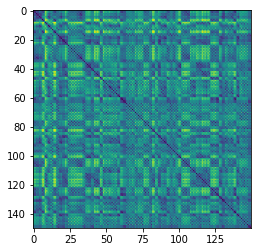

connectome


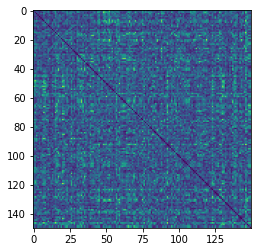

inv connectome


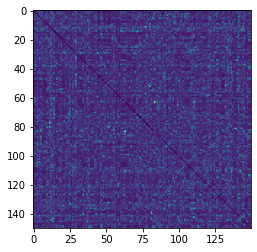

inv connectome * spatial map


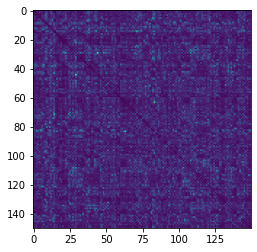

sup inv connectome * spatial map


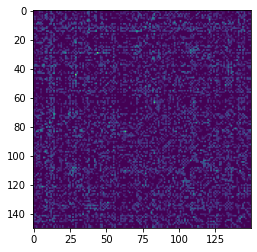

In [5]:
print('spatial map')
plt.imshow(
    connectome.spatial_map().to_numpy()
)
plt.show()

inv_connectome = connectome.inverse()
spatial_map = connectome.spatial_map()

print('connectome')
plt.imshow(
    connectome.matrix.to_numpy()
)
plt.show()

print('inv connectome')
plt.imshow(
    inv_connectome.to_numpy()
)
plt.show()

print('inv connectome * spatial map')
plt.imshow(
    spatial_map.to_numpy() *
    inv_connectome.to_numpy()
)
plt.show()

print('sup inv connectome * spatial map')
plt.imshow(
    spatial_map.to_numpy() *
    lmd.suppress(
        inv_connectome,
        trigger=inv_connectome.to_numpy().mean().mean(),
        optimal=0
    ).to_numpy()
)
plt.show()

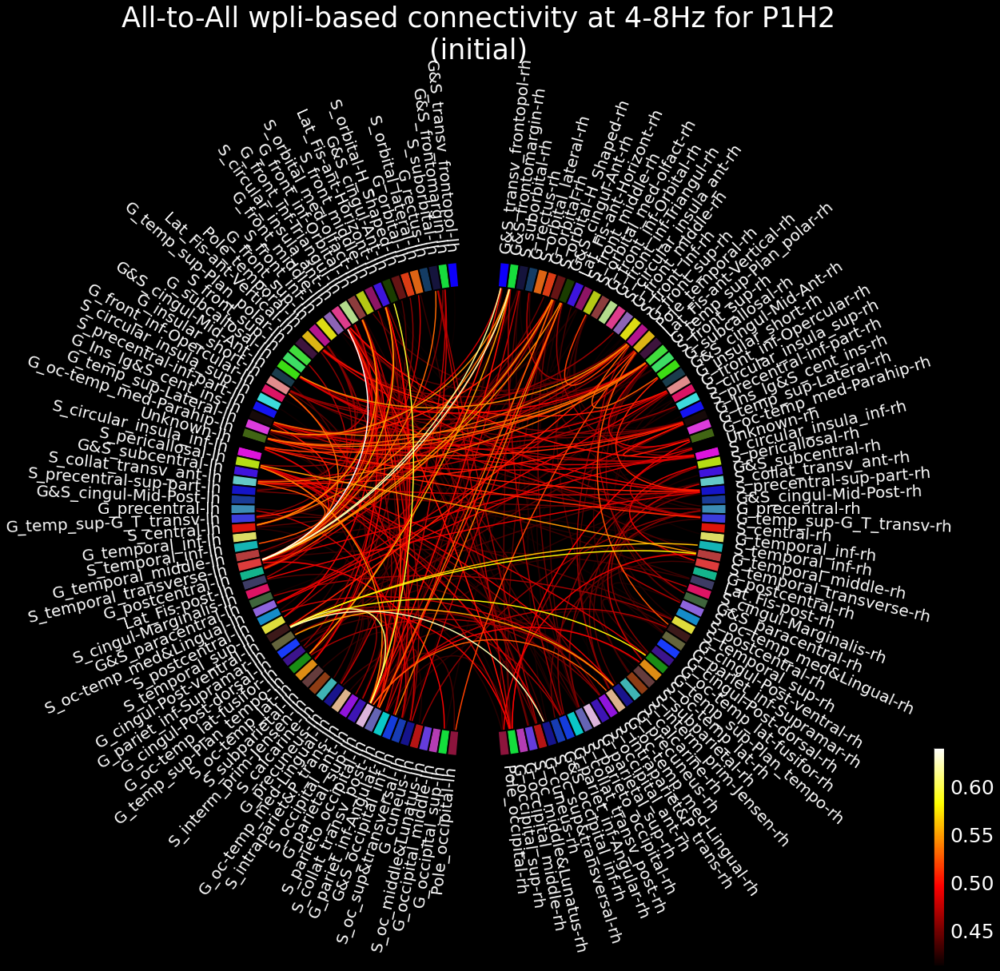

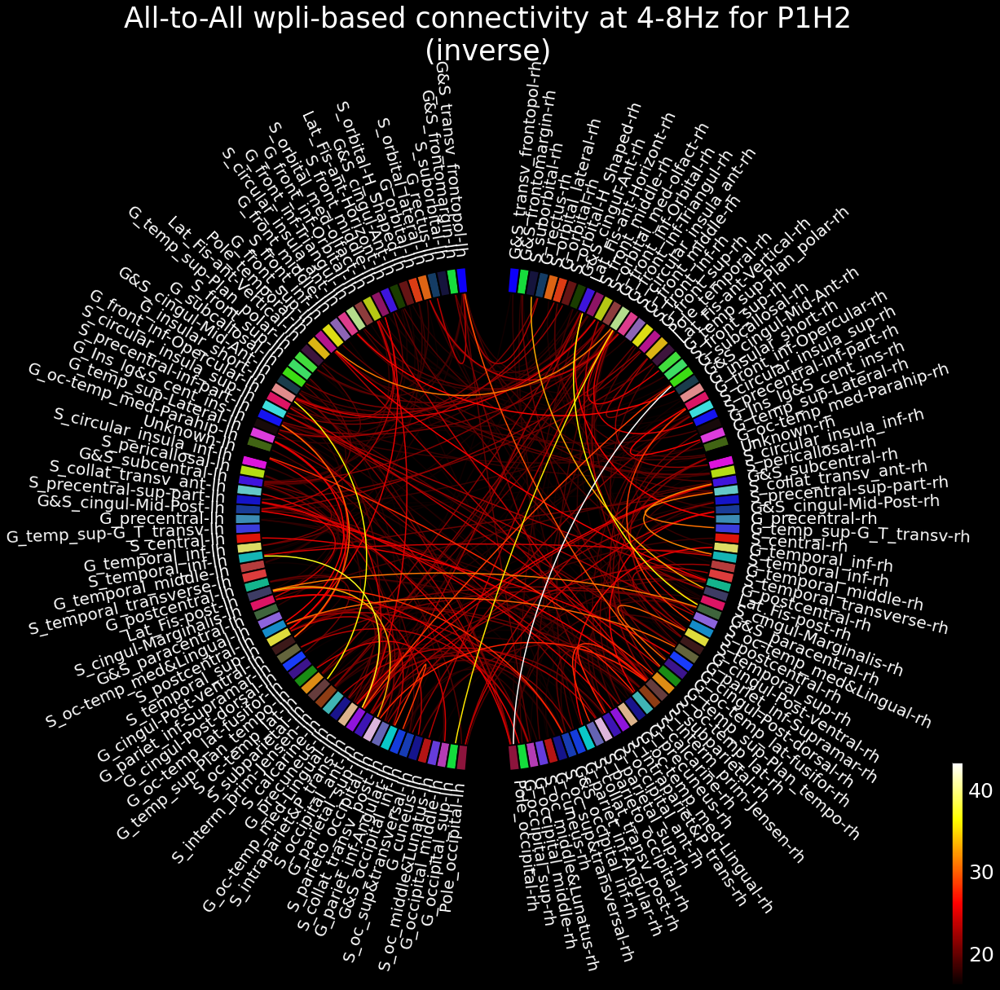

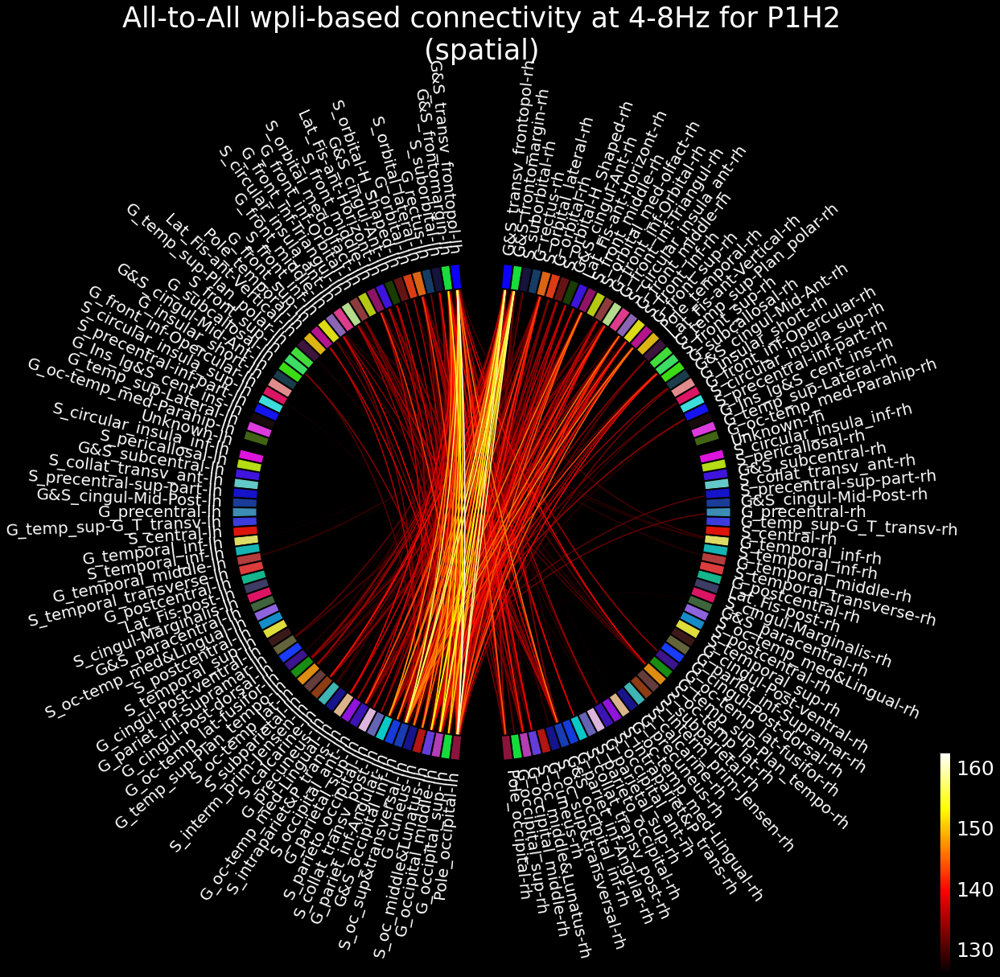

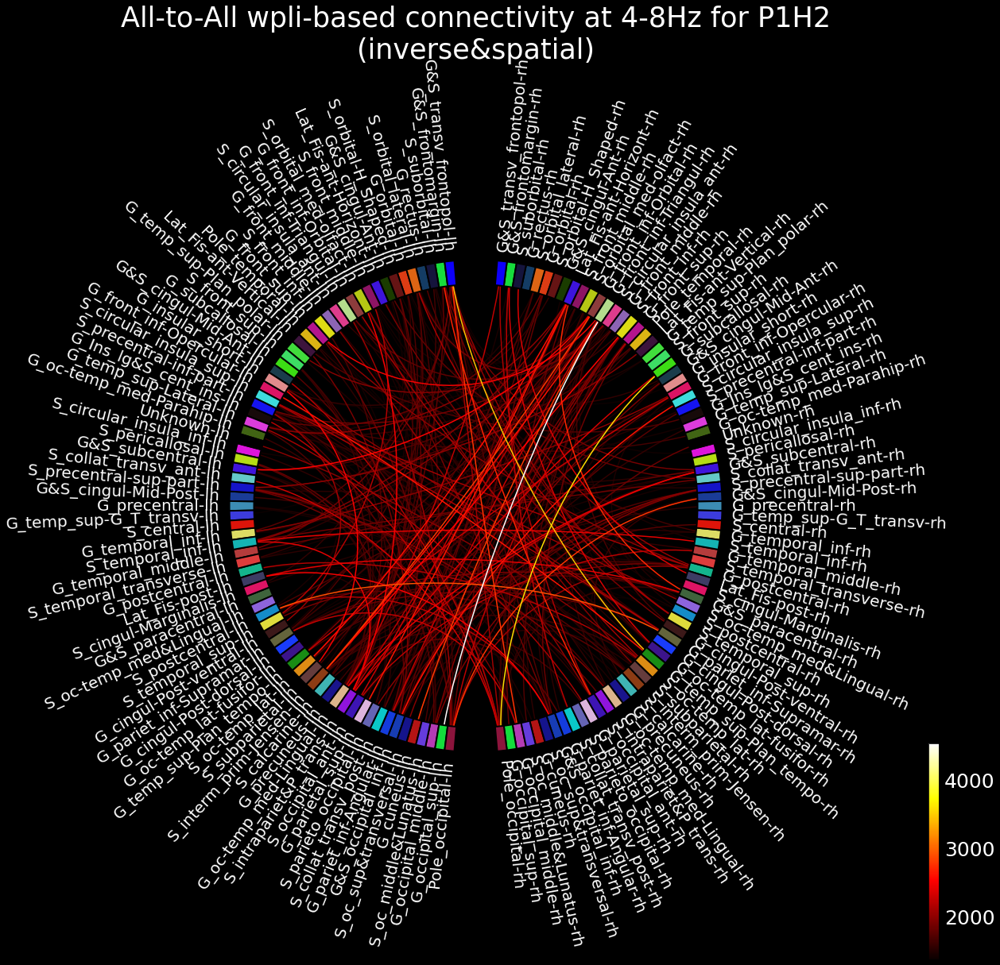

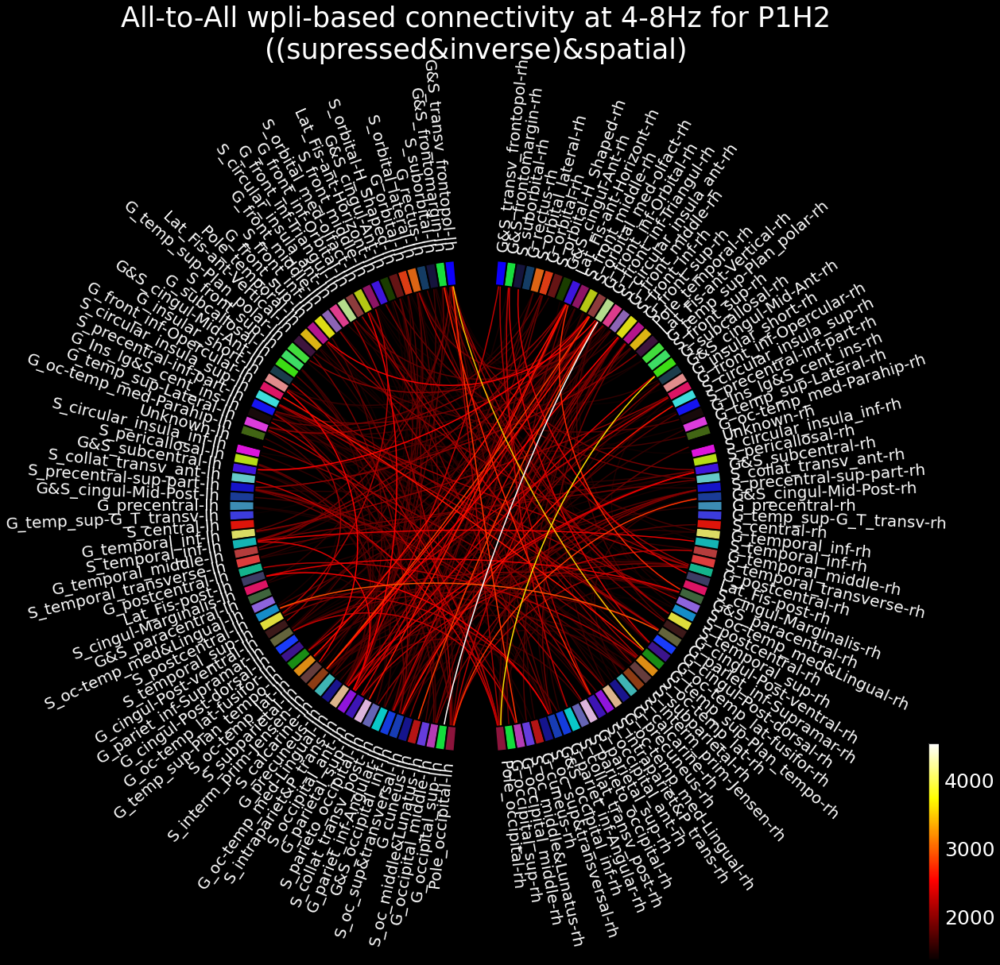

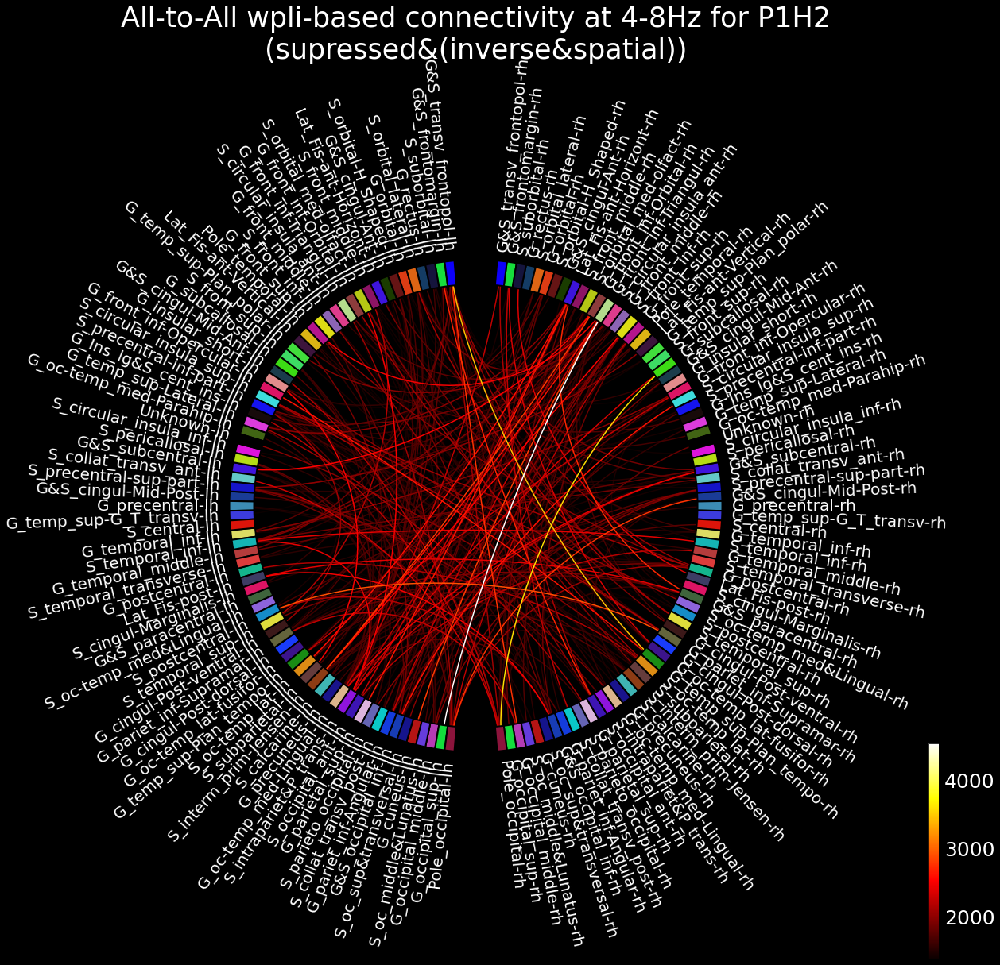

In [6]:
connectome.plot(title='initial')
connectome.plot(inv_connectome, title='inverse')
connectome.plot(spatial_map, title='spatial')
connectome.plot(inv_connectome*spatial_map, title='inverse&spatial')
connectome.plot(
    lmd.suppress(
        inv_connectome,
        trigger=inv_connectome.to_numpy().mean().mean(),
        optimal=0)*
    spatial_map,
    title='(supressed&inverse)&spatial'
)
connectome.plot(
    lmd.suppress(
        inv_connectome*spatial_map,
        trigger=(inv_connectome*spatial_map).to_numpy().mean().mean(),
        optimal=0),
    title='supressed&(inverse&spatial)'
)

In [8]:
# def normalize_df(df: pd.DataFrame) -> pd.DataFrame:
#     columns = df.columns.tolist()
#     index = df.index.tolist()
#     data = df.to_numpy()
#     norm = np.linalg.norm(data)
#     return pd.DataFrame(
#         data/norm,
#         columns=columns,
#         index=index
#     )
#
# connectome.plot(normalize_df(inv_connectome)*normalize_df(spatial_map), title='inverse&spatial, normalized')
#
# connectome.plot(
#     normalize_df(lmd.suppress(
#         inv_connectome,
#         trigger=inv_connectome.to_numpy().mean().mean(),
#         optimal=0))*
#     normalize_df(spatial_map),
#     title='(supressed&inverse)&spatial, normalized'
# )
#
# connectome.plot(
#     lmd.suppress(
#         normalize_df(inv_connectome)*normalize_df(spatial_map),
#         trigger=(inv_connectome*spatial_map).to_numpy().mean().mean(),
#         optimal=0),
#     title='supressed&(inverse&spatial), normalized'
# )
